# Task 2

Found 6820 files belonging to 150 classes.
Classes: ['Abra', 'Aerodactyl', 'Alakazam', 'Alolan Sandslash', 'Arbok', 'Arcanine', 'Articuno', 'Beedrill', 'Bellsprout', 'Blastoise', 'Bulbasaur', 'Butterfree', 'Caterpie', 'Chansey', 'Charizard', 'Charmander', 'Charmeleon', 'Clefable', 'Clefairy', 'Cloyster', 'Cubone', 'Dewgong', 'Diglett', 'Ditto', 'Dodrio', 'Doduo', 'Dragonair', 'Dragonite', 'Dratini', 'Drowzee', 'Dugtrio', 'Eevee', 'Ekans', 'Electabuzz', 'Electrode', 'Exeggcute', 'Exeggutor', 'Farfetchd', 'Fearow', 'Flareon', 'Gastly', 'Gengar', 'Geodude', 'Gloom', 'Golbat', 'Goldeen', 'Golduck', 'Golem', 'Graveler', 'Grimer', 'Growlithe', 'Gyarados', 'Haunter', 'Hitmonchan', 'Hitmonlee', 'Horsea', 'Hypno', 'Ivysaur', 'Jigglypuff', 'Jolteon', 'Jynx', 'Kabuto', 'Kabutops', 'Kadabra', 'Kakuna', 'Kangaskhan', 'Kingler', 'Koffing', 'Krabby', 'Lapras', 'Lickitung', 'Machamp', 'Machoke', 'Machop', 'Magikarp', 'Magmar', 'Magnemite', 'Magneton', 'Mankey', 'Marowak', 'Meowth', 'Metapod', 'Mew', '

C:\Users\Neil\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\core\input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Epoch 1, Loss: 8099.4893, time=9.76s
Epoch 2, Loss: 7386.3442, time=8.23s
Epoch 3, Loss: 7245.7432, time=8.35s
Epoch 4, Loss: 7080.8579, time=8.50s
Epoch 5, Loss: 6721.4604, time=11.76s
Epoch 6, Loss: 6502.6187, time=12.62s
Epoch 7, Loss: 6414.9858, time=9.81s
Epoch 8, Loss: 6329.3413, time=8.58s
Epoch 9, Loss: 6260.6973, time=8.77s
Epoch 10, Loss: 6213.9082, time=10.07s
Epoch 11, Loss: 6174.0479, time=10.79s
Epoch 12, Loss: 6141.6289, time=10.61s
Epoch 13, Loss: 6106.0156, time=9.77s
Epoch 14, Loss: 6078.9961, time=9.97s
Epoch 15, Loss: 6054.6572, time=9.81s
Epoch 16, Loss: 6033.8374, time=10.99s
Epoch 17, Loss: 6016.8867, time=11.06s
Epoch 18, Loss: 5996.7534, time=13.68s
Epoch 19, Loss: 5983.4771, time=13.51s
Epoch 20, Loss: 5970.3779, time=14.60s
Epoch 21, Loss: 5955.4106, time=11.08s
Epoch 22, Loss: 5944.8057, time=8.81s
Epoch 23, Loss: 5933.4941, time=8.65s
Epoch 24, Loss: 5924.8101, time=11.74s
Epoch 25, Loss: 5914.3892, time=13.76s
Epoch 26, Loss: 5903.9790, time=10.55s
Epoch 2

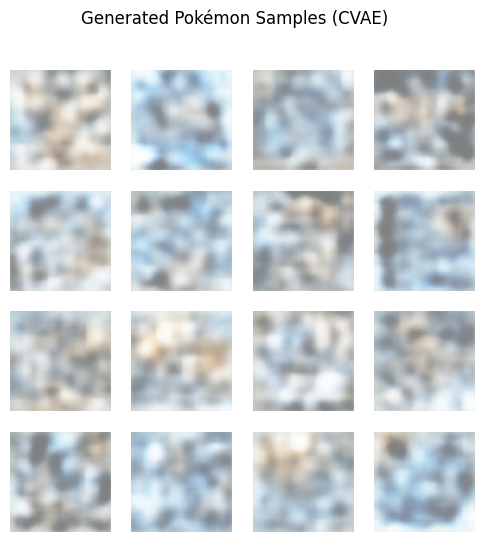

In [21]:
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import tensorflow_probability as tfp
import time
import os

IMG_SIZE = 64
BATCH_SIZE = 64
LATENT_DIM = 128
EPOCHS = 30

train_ds_raw = tf.keras.utils.image_dataset_from_directory(
    "PokemonData",
    label_mode="int",
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True
)

# Save class names first
class_names = train_ds_raw.class_names
num_classes = len(class_names)
print("Classes:", class_names)

# Normalize images afterward
train_ds = train_ds_raw.map(lambda x, y: ((tf.cast(x, tf.float32) / 127.5) - 1.0, y))



class CVAE(tf.keras.Model):
    def __init__(self, latent_dim, num_classes):
        super(CVAE, self).__init__()
        self.latent_dim = latent_dim
        self.num_classes = num_classes

        self.encoder = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(IMG_SIZE, IMG_SIZE, 3)),
            tf.keras.layers.Conv2D(32, 3, strides=2, activation="relu", padding="same"),
            tf.keras.layers.Conv2D(64, 3, strides=2, activation="relu", padding="same"),
            tf.keras.layers.Conv2D(128, 3, strides=2, activation="relu", padding="same"),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(2*latent_dim),
        ])

        self.decoder = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(latent_dim + num_classes,)),
            tf.keras.layers.Dense(8*8*128, activation="relu"),
            tf.keras.layers.Reshape((8, 8, 128)),
            tf.keras.layers.Conv2DTranspose(128, 3, strides=2, padding="same", activation="relu"),
            tf.keras.layers.Conv2DTranspose(64, 3, strides=2, padding="same", activation="relu"),
            tf.keras.layers.Conv2DTranspose(32, 3, strides=2, padding="same", activation="relu"),
            tf.keras.layers.Conv2DTranspose(3, 3, strides=1, padding="same")
        ])

    def encode(self, x):
        mean_logvar = self.encoder(x)
        mean, logvar = tf.split(mean_logvar, num_or_size_splits=2, axis=1)
        return mean, logvar

    def reparameterize(self, mean, logvar):
        eps = tf.random.normal(shape=mean.shape)
        return eps * tf.exp(0.5 * logvar) + mean

    def decode(self, z, labels, apply_sigmoid=False):
        y = tf.one_hot(labels, self.num_classes)
        z = tf.concat([z, y], axis=1)
        logits = self.decoder(z)
        return tf.sigmoid(logits) if apply_sigmoid else logits


def log_normal_pdf(sample, mean, logvar, raxis=1):
    log2pi = tf.math.log(2. * np.pi)
    return tf.reduce_sum(
        -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
        axis=raxis
    )

def compute_loss(model, x, y):
    mean, logvar = model.encode(x)
    z = model.reparameterize(mean, logvar)
    x_logit = model.decode(z, y)

    cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(
        logits=x_logit, labels=(x + 1) / 2.0
    )
    logpx_z = -tf.reduce_sum(cross_ent, axis=[1,2,3])

    logpz = log_normal_pdf(z, 0., 0.)
    logqz_x = log_normal_pdf(z, mean, logvar)
    return -tf.reduce_mean(logpx_z + logpz - logqz_x)

@tf.function
def train_step(model, x, y, optimizer):
    with tf.GradientTape() as tape:
        loss = compute_loss(model, x, y)
    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return loss


cvae = CVAE(LATENT_DIM, num_classes)
optimizer = tf.keras.optimizers.Adam(1e-4)

for epoch in range(EPOCHS):
    start_time = time.time()
    total_loss = 0
    for x, y in train_ds:
        loss = train_step(cvae, x, y, optimizer)
        total_loss += loss
    print(f"Epoch {epoch+1}, Loss: {total_loss/len(train_ds):.4f}, time={time.time()-start_time:.2f}s")


def plot_images(model, label=None):
    z = tf.random.normal([16, LATENT_DIM])
    if label is None:
        labels = np.random.randint(0, num_classes, size=(16,))
    else:
        labels = np.array([label] * 16)
    preds = model.decode(z, labels, apply_sigmoid=True).numpy()

    fig, axes = plt.subplots(4, 4, figsize=(6,6))
    for i, ax in enumerate(axes.flat):
        ax.imshow(preds[i] * 0.5 + 0.5)
        ax.axis("off")
    plt.suptitle("Generated Pokémon Samples (CVAE)")
    plt.show()

plot_images(cvae, label=None)


The output doesn't seem to be the best. The reason for this could be because of the large amount of classes and the small amount of data for each class (150 classes with 60 images per).

Found 6820 files.


C:\Users\Neil\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\core\dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
C:\Users\Neil\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


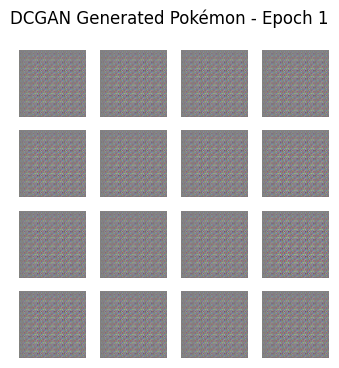

Epoch 1, Gen Loss: 0.9034, Disc Loss: 0.8935, Time: 21.15s


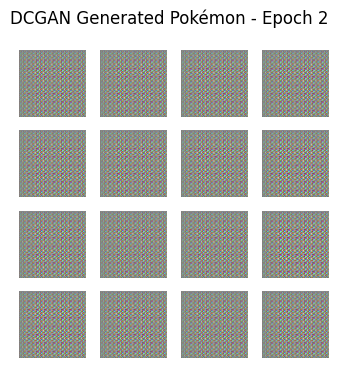

Epoch 2, Gen Loss: 1.8907, Disc Loss: 0.3470, Time: 23.49s


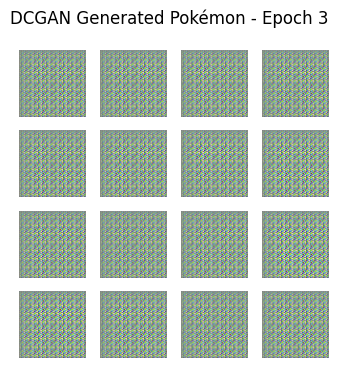

Epoch 3, Gen Loss: 2.3685, Disc Loss: 0.2428, Time: 27.40s


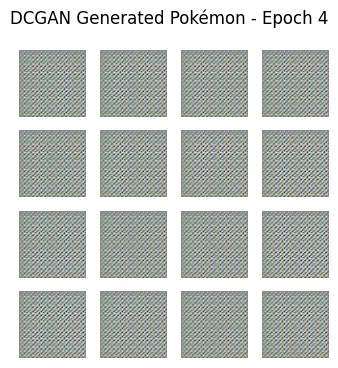

Epoch 4, Gen Loss: 3.0346, Disc Loss: 0.1756, Time: 21.22s


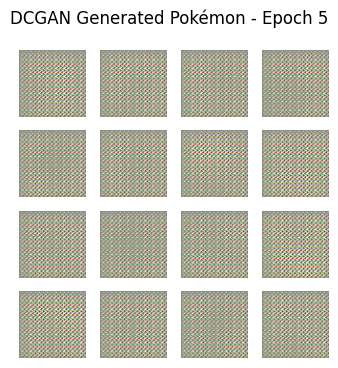

Epoch 5, Gen Loss: 3.6656, Disc Loss: 0.1054, Time: 33.53s


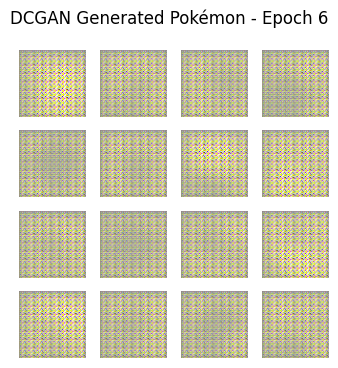

Epoch 6, Gen Loss: 4.2454, Disc Loss: 0.0566, Time: 38.69s


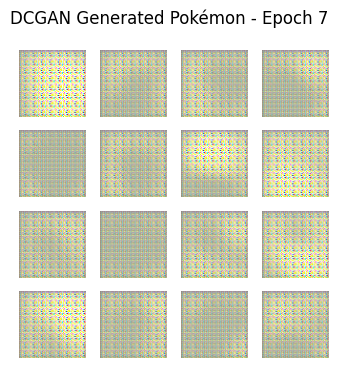

Epoch 7, Gen Loss: 4.2579, Disc Loss: 0.1042, Time: 24.66s


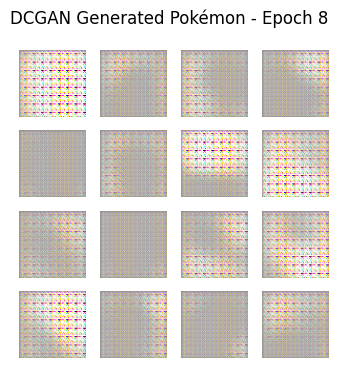

Epoch 8, Gen Loss: 4.1924, Disc Loss: 0.1212, Time: 25.41s


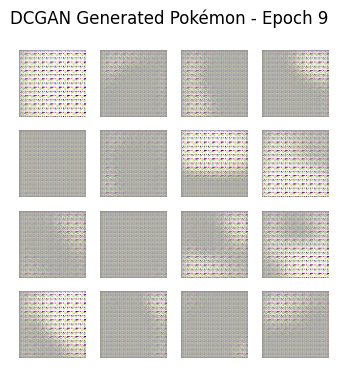

Epoch 9, Gen Loss: 3.7424, Disc Loss: 0.1146, Time: 26.33s


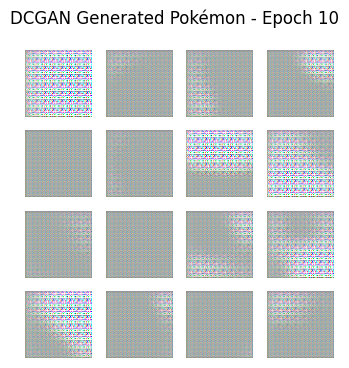

Epoch 10, Gen Loss: 5.1871, Disc Loss: 0.1302, Time: 26.01s


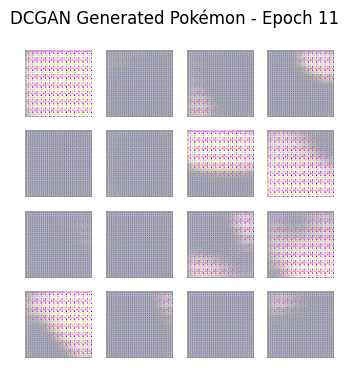

Epoch 11, Gen Loss: 6.8118, Disc Loss: 0.1119, Time: 37.67s


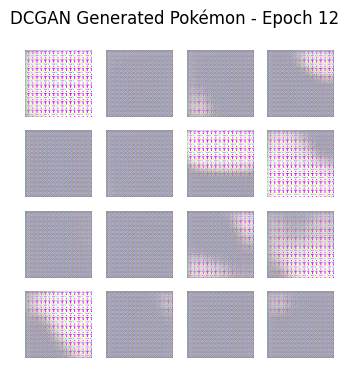

Epoch 12, Gen Loss: 5.7094, Disc Loss: 0.0906, Time: 26.53s


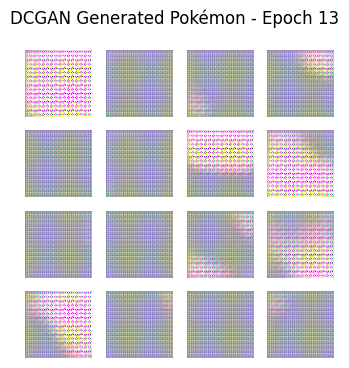

Epoch 13, Gen Loss: 5.0554, Disc Loss: 0.0972, Time: 19.08s


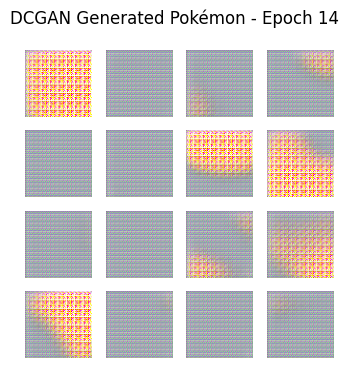

Epoch 14, Gen Loss: 4.4034, Disc Loss: 0.0764, Time: 21.79s


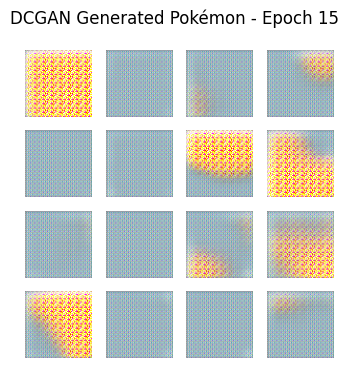

Epoch 15, Gen Loss: 4.6110, Disc Loss: 0.0760, Time: 22.69s


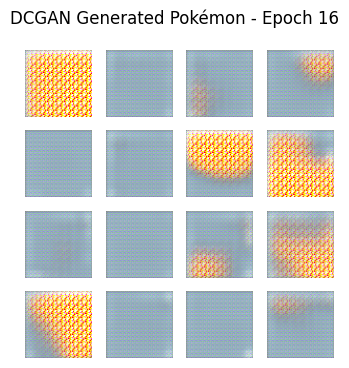

Epoch 16, Gen Loss: 4.2005, Disc Loss: 0.1053, Time: 32.02s


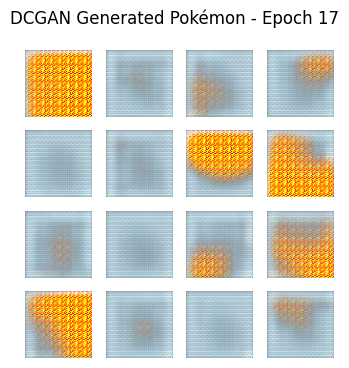

Epoch 17, Gen Loss: 4.4327, Disc Loss: 0.2544, Time: 34.95s


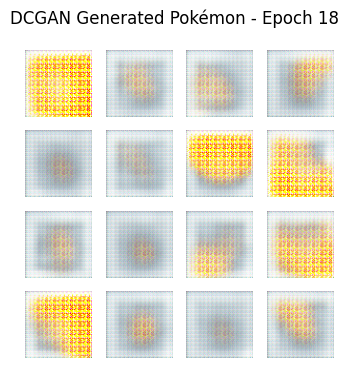

Epoch 18, Gen Loss: 3.5999, Disc Loss: 0.3209, Time: 32.84s


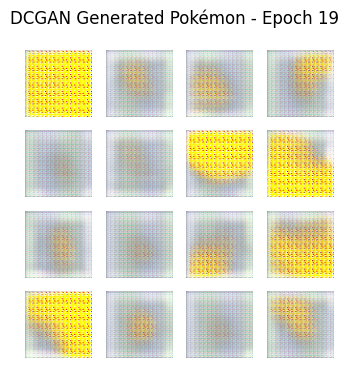

Epoch 19, Gen Loss: 3.9782, Disc Loss: 0.2663, Time: 20.12s


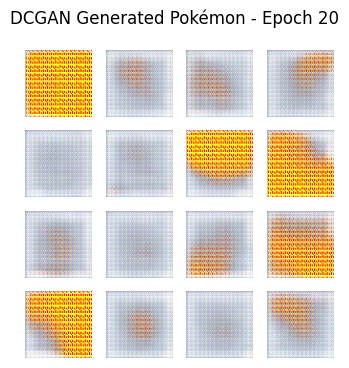

Epoch 20, Gen Loss: 3.7115, Disc Loss: 0.4067, Time: 30.67s


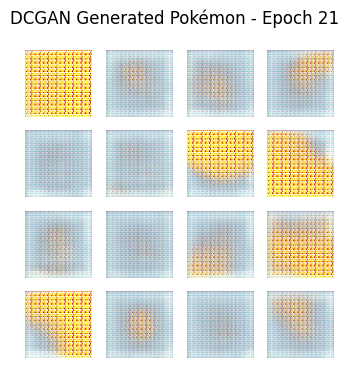

Epoch 21, Gen Loss: 4.1468, Disc Loss: 0.2272, Time: 31.03s


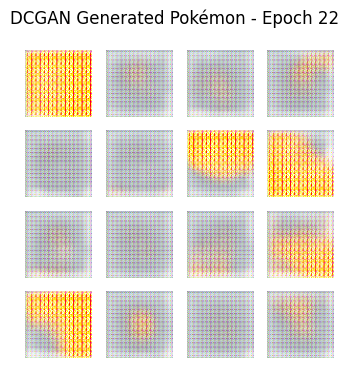

Epoch 22, Gen Loss: 6.0481, Disc Loss: 0.1886, Time: 35.44s


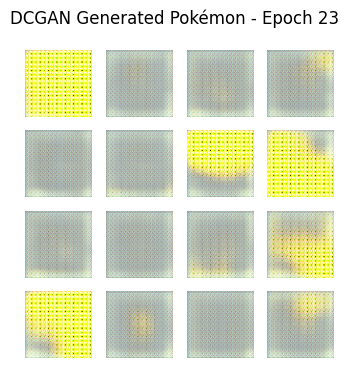

Epoch 23, Gen Loss: 10.0676, Disc Loss: 0.1411, Time: 24.04s


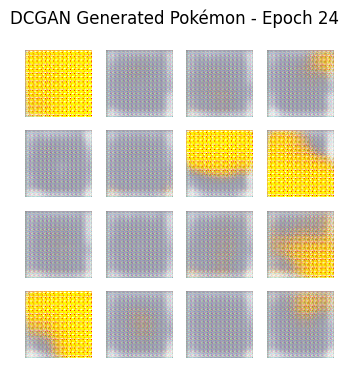

Epoch 24, Gen Loss: 5.6397, Disc Loss: 0.1092, Time: 20.75s


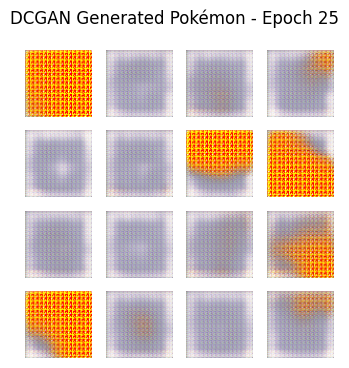

Epoch 25, Gen Loss: 4.2735, Disc Loss: 0.2107, Time: 31.79s


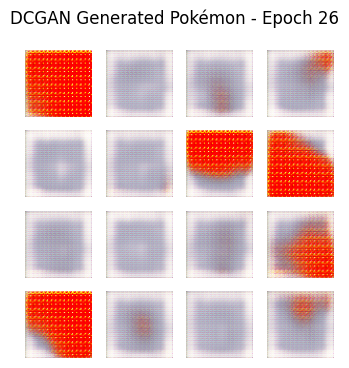

Epoch 26, Gen Loss: 3.9115, Disc Loss: 0.3473, Time: 34.52s


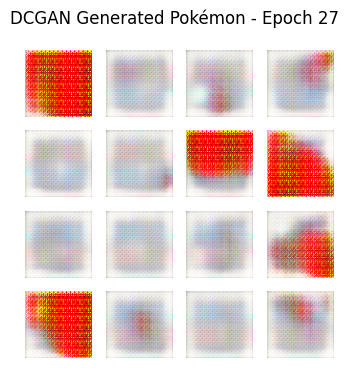

Epoch 27, Gen Loss: 4.3887, Disc Loss: 0.1531, Time: 45.95s


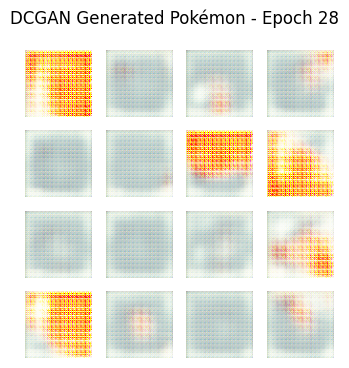

Epoch 28, Gen Loss: 3.7221, Disc Loss: 0.2378, Time: 22.14s


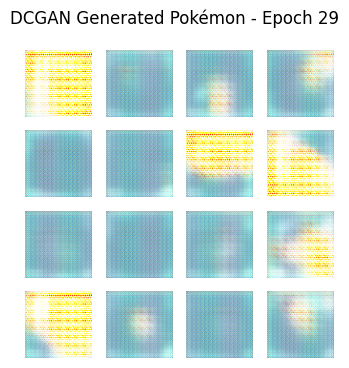

Epoch 29, Gen Loss: 4.2867, Disc Loss: 0.1458, Time: 21.31s


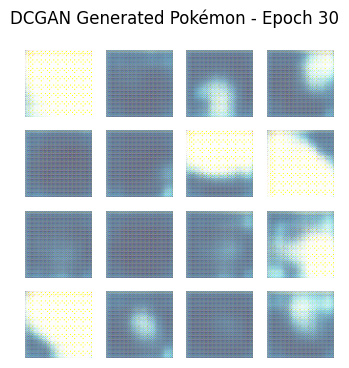

Epoch 30, Gen Loss: 4.9526, Disc Loss: 0.3424, Time: 22.13s


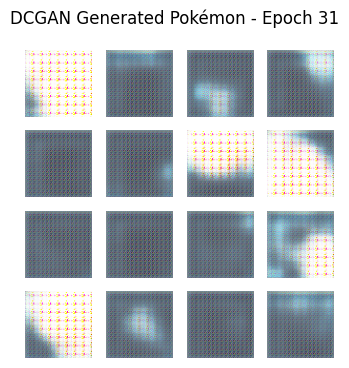

Epoch 31, Gen Loss: 4.5339, Disc Loss: 0.3154, Time: 25.97s


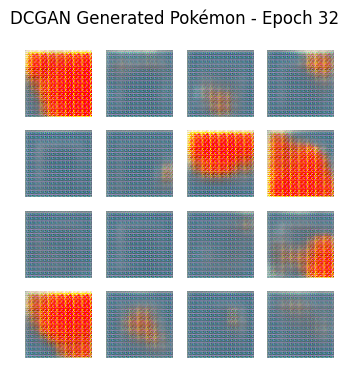

Epoch 32, Gen Loss: 4.3403, Disc Loss: 0.2170, Time: 38.16s


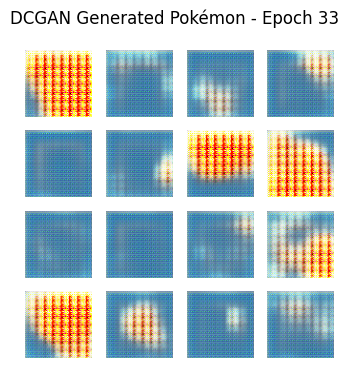

Epoch 33, Gen Loss: 4.1563, Disc Loss: 0.3317, Time: 37.11s


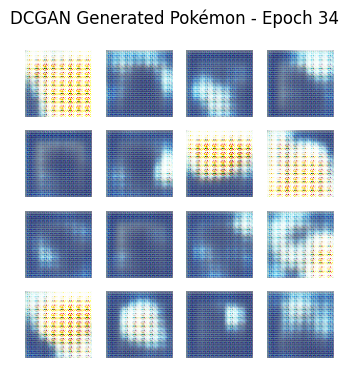

Epoch 34, Gen Loss: 3.9634, Disc Loss: 0.4364, Time: 33.54s


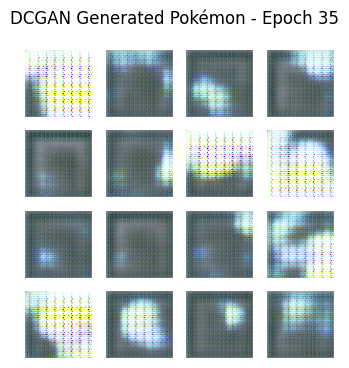

Epoch 35, Gen Loss: 3.9745, Disc Loss: 0.3620, Time: 25.81s


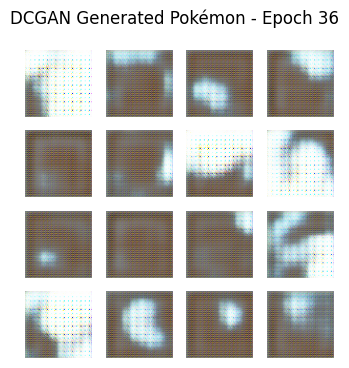

Epoch 36, Gen Loss: 3.7074, Disc Loss: 0.3298, Time: 21.22s


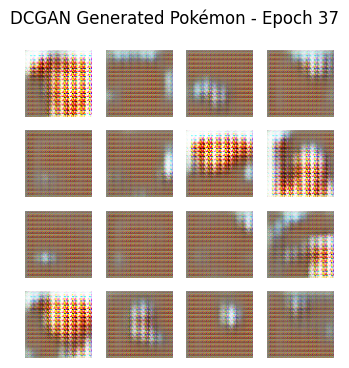

Epoch 37, Gen Loss: 3.5046, Disc Loss: 0.4314, Time: 22.55s


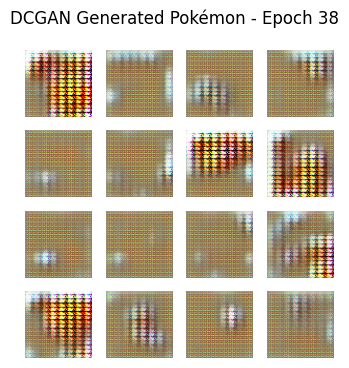

Epoch 38, Gen Loss: 4.0434, Disc Loss: 0.2759, Time: 24.94s


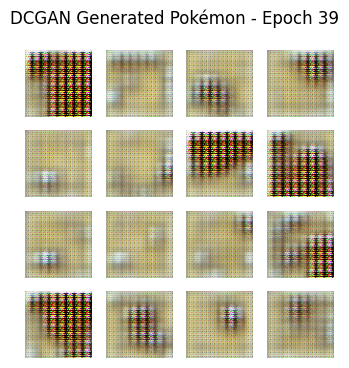

Epoch 39, Gen Loss: 3.8745, Disc Loss: 0.1876, Time: 36.61s


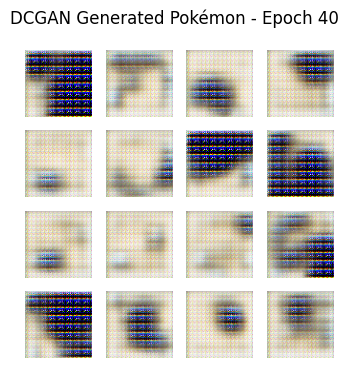

Epoch 40, Gen Loss: 3.6437, Disc Loss: 0.3448, Time: 38.95s


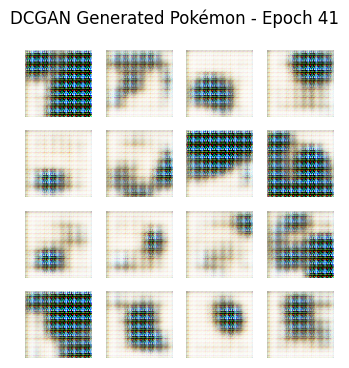

Epoch 41, Gen Loss: 3.8624, Disc Loss: 0.2802, Time: 29.94s


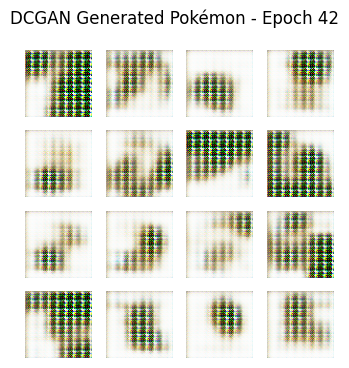

Epoch 42, Gen Loss: 4.3305, Disc Loss: 0.2466, Time: 19.72s


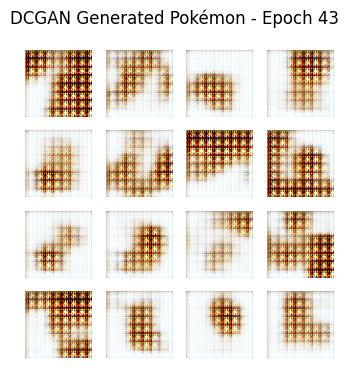

Epoch 43, Gen Loss: 4.0049, Disc Loss: 0.2964, Time: 20.92s


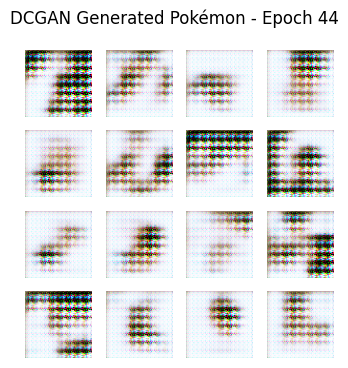

Epoch 44, Gen Loss: 3.8747, Disc Loss: 0.2874, Time: 27.86s


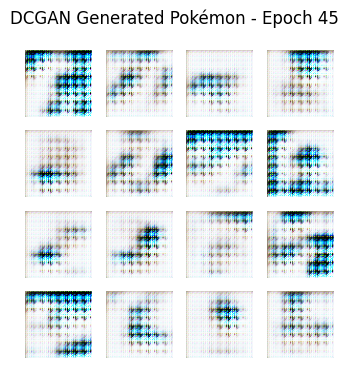

Epoch 45, Gen Loss: 3.5629, Disc Loss: 0.2400, Time: 37.00s


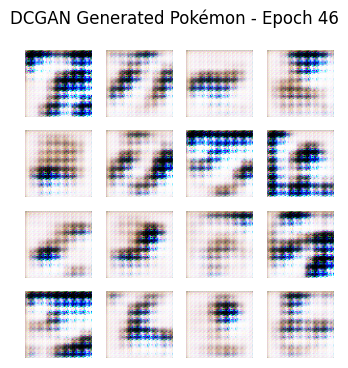

Epoch 46, Gen Loss: 4.1012, Disc Loss: 0.3956, Time: 36.28s


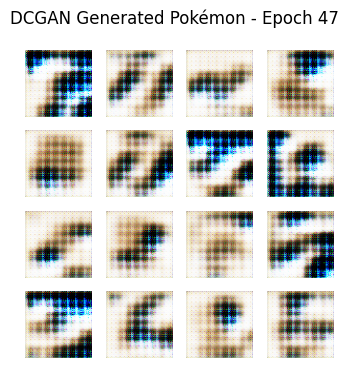

Epoch 47, Gen Loss: 3.3077, Disc Loss: 0.6140, Time: 22.80s


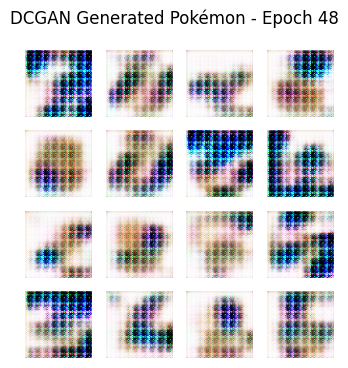

Epoch 48, Gen Loss: 3.4309, Disc Loss: 0.3335, Time: 21.61s


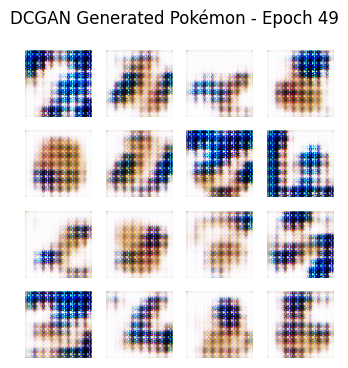

Epoch 49, Gen Loss: 3.2313, Disc Loss: 0.4179, Time: 35.55s


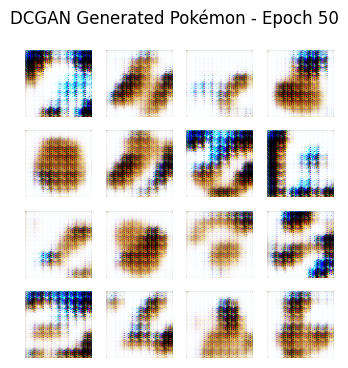

Epoch 50, Gen Loss: 3.8728, Disc Loss: 0.5179, Time: 26.97s


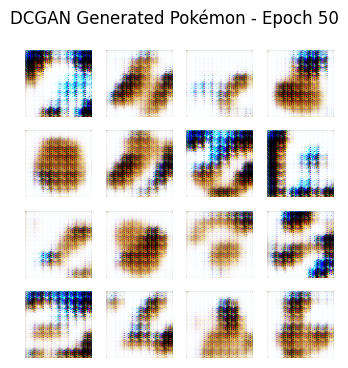

In [22]:
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import time
import os

IMG_SIZE = 64
BATCH_SIZE = 128
EPOCHS = 50
NOISE_DIM = 100
NUM_EXAMPLES_TO_GENERATE = 16

train_ds = tf.keras.utils.image_dataset_from_directory(
    "PokemonData",
    label_mode=None,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True
)

train_ds = train_ds.map(lambda x: (tf.cast(x, tf.float32) - 127.5) / 127.5)


train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

def make_generator_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Dense(8*8*256, use_bias=False, input_shape=(NOISE_DIM,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.ReLU())
    model.add(tf.keras.layers.Reshape((8, 8, 256)))

    model.add(tf.keras.layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.ReLU())

    model.add(tf.keras.layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.ReLU())

    model.add(tf.keras.layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    return model

def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[IMG_SIZE, IMG_SIZE, 3]))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(1))
    return model

cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator = make_generator_model()
discriminator = make_discriminator_model()

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# Fixed seed to visualize progress
seed = tf.random.normal([NUM_EXAMPLES_TO_GENERATE, NOISE_DIM])

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()
        g_loss, d_loss = 0, 0
        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch)
            g_loss += gen_loss
            d_loss += disc_loss

        # Generate sample images
        generate_and_save_images(generator, epoch + 1, seed)

        print(f'Epoch {epoch+1}, Gen Loss: {g_loss.numpy()/len(dataset):.4f}, Disc Loss: {d_loss.numpy()/len(dataset):.4f}, Time: {time.time()-start:.2f}s')

    # Final images
    generate_and_save_images(generator, epochs, seed)

def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i] * 127.5 + 127.5).numpy().astype("uint8"))
        plt.axis('off')

    plt.suptitle(f'DCGAN Generated Pokémon - Epoch {epoch}')
    plt.show()

train(train_ds, EPOCHS)
